<a href="https://colab.research.google.com/github/puneethyerninti/text-to-image-objectdetection/blob/main/text_to_image_colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install diffusers transformers accelerate
!pip install torch --index-url https://download.pytorch.org/whl/cpu  # or GPU if using Colab GPU


Looking in indexes: https://download.pytorch.org/whl/cpu


In [ ]:
from diffusers import StableDiffusionPipeline
import torch
from IPython.display import display

# High-quality model
model_id = "runwayml/stable-diffusion-v1-5"  # best balance
pipe = StableDiffusionPipeline.from_pretrained(model_id).to("cuda")


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
images = pipe(prompt, num_inference_steps=25, guidance_scale=7.5, num_images_per_prompt=3).images


NameError: name 'prompt' is not defined

  0%|          | 0/50 [00:00<?, ?it/s]

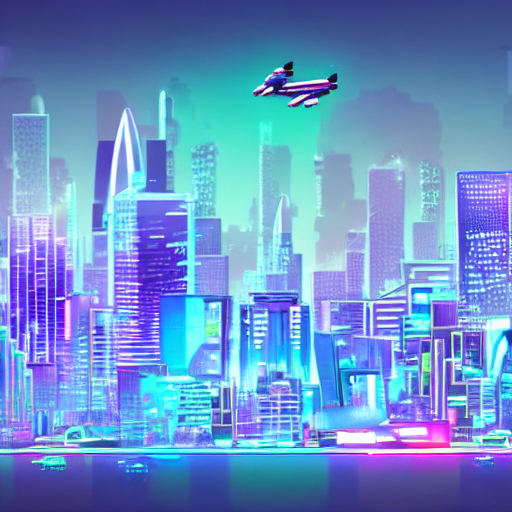

In [ ]:
prompt = "a futuristic city with flying cars, neon lights, and skyscrapers"

image = pipe(prompt).images[0]
display(image)
image.save("output.png")


In [ ]:
prompt = "a futuristic city with flying cars, neon lights, and skyscrapers"


  0%|          | 0/50 [00:00<?, ?it/s]

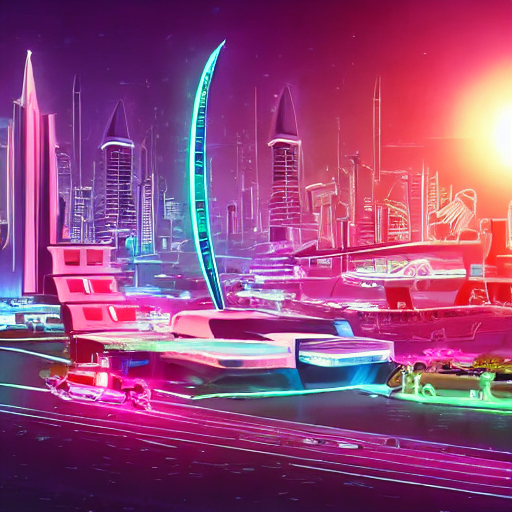

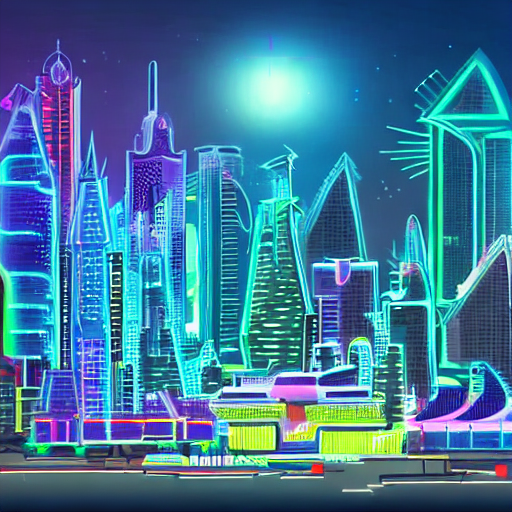

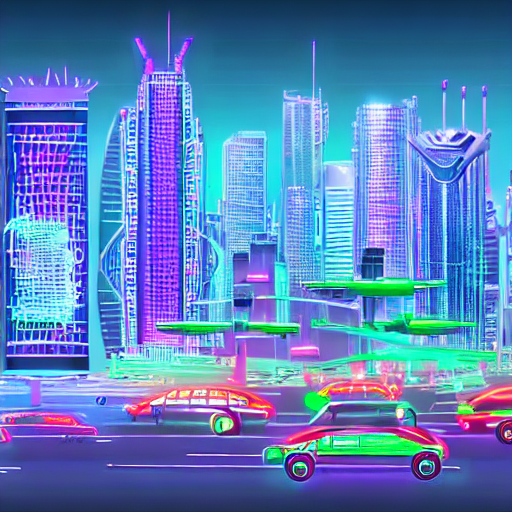

In [ ]:
images = pipe(prompt, num_inference_steps=50, guidance_scale=7.5, num_images_per_prompt=3).images

from IPython.display import display
for idx, img in enumerate(images):
    display(img)
    img.save(f"output_{idx+1}.png")


In [ ]:
prompt = "a futuristic city with flying cars, neon lights, and skyscrapers, ultra-detailed, cinematic lighting"


  0%|          | 0/50 [00:00<?, ?it/s]

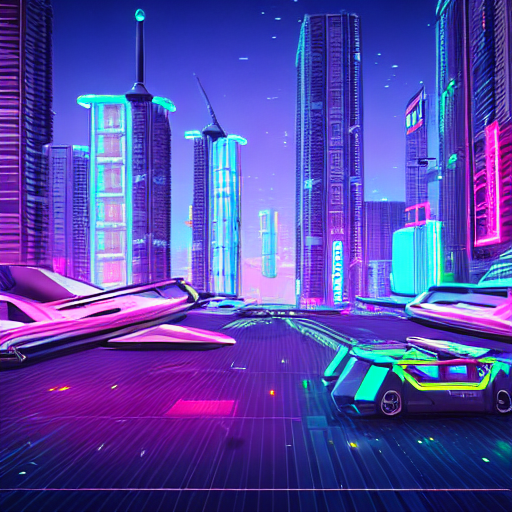

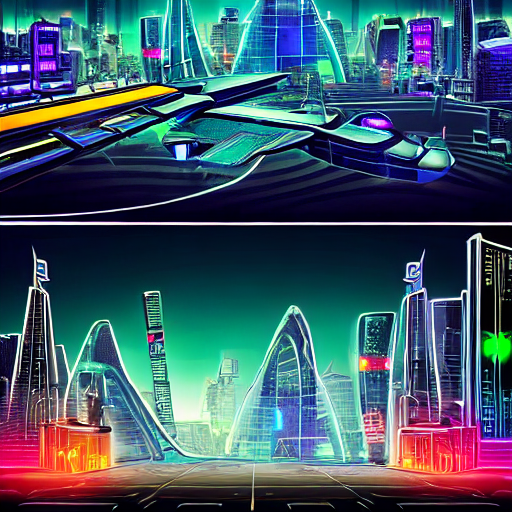

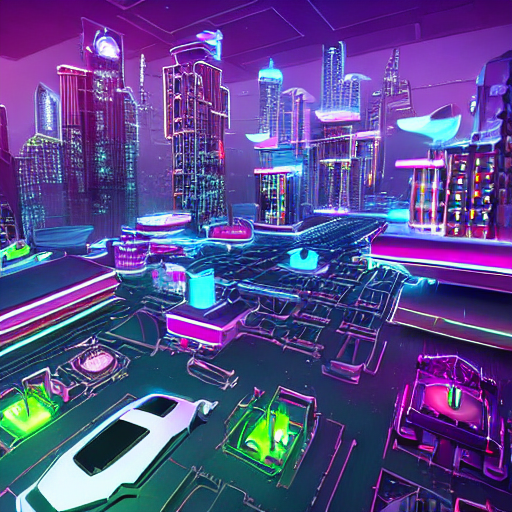

In [ ]:
images = pipe(
    prompt,
    num_inference_steps=50,   # more steps = better detail
    guidance_scale=8.5,       # more faithful to prompt
    num_images_per_prompt=3   # generate 3 variations
).images

# Display and save
for idx, img in enumerate(images):
    display(img)
    img.save(f"output_{idx+1}.png")


In [ ]:
!pip install diffusers transformers accelerate safetensors
!pip install torch torchvision --index-url https://download.pytorch.org/whl/cu121


Looking in indexes: https://download.pytorch.org/whl/cu121


In [ ]:
from diffusers import StableDiffusionPipeline
import torch

model_id = "stabilityai/stable-diffusion-xl-base-1.0"

pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
)
pipe = pipe.to("cuda")


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

text_encoder/model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

text_encoder_2/model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.fp16.safete(…):   0%|          | 0.00/5.14G [00:00<?, ?B/s]

vae_1_0/diffusion_pytorch_model.fp16.saf(…):   0%|          | 0.00/167M [00:00<?, ?B/s]

vae/diffusion_pytorch_model.fp16.safeten(…):   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [ ]:
prompt = "a hyper realistic portrait of a lion wearing a crown, 8k UHD, cinematic lighting"
image = pipe(prompt, num_inference_steps=40, guidance_scale=7.5).images[0]

image.save("high_quality.png")
image


  0%|          | 0/40 [00:00<?, ?it/s]

TypeError: argument of type 'NoneType' is not iterable

In [ ]:
from diffusers import StableDiffusionUpscalePipeline

upscaler_id = "stabilityai/stable-diffusion-x4-upscaler"
upscaler = StableDiffusionUpscalePipeline.from_pretrained(
    upscaler_id, torch_dtype=torch.float16
)
upscaler = upscaler.to("cuda")

upscaled_image = upscaler(prompt=prompt, image=image).images[0]
upscaled_image.save("high_quality_upscaled.png")
upscaled_image


model_index.json:   0%|          | 0.00/485 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/634 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/300 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/348 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/825 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/982 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/587 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.89G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/221M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

NameError: name 'image' is not defined

In [ ]:
!pip install diffusers transformers accelerate safetensors
!pip install torch torchvision --index-url https://download.pytorch.org/whl/cu121


Looking in indexes: https://download.pytorch.org/whl/cu121


In [ ]:
from diffusers import StableDiffusionXLPipeline
import torch

model_id = "stabilityai/stable-diffusion-xl-base-1.0"

pipe = StableDiffusionXLPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
)
pipe = pipe.to("cuda")


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

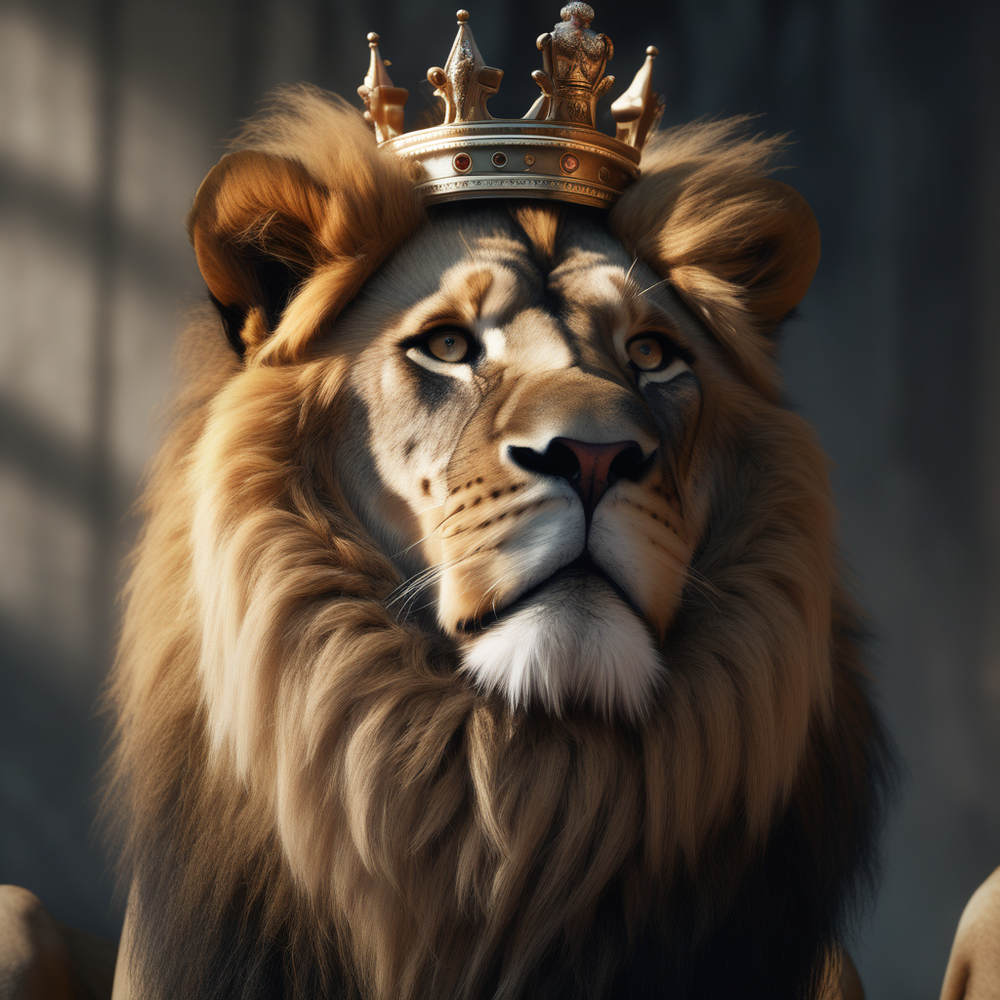

In [ ]:
prompt = "a hyper realistic portrait of a lion wearing a crown, 8k UHD, cinematic lighting, masterpiece, ultra-detailed"

image = pipe(
    prompt=prompt,
    num_inference_steps=40,
    guidance_scale=7.5
).images[0]

image.save("base_image.png")
image


In [ ]:
from diffusers import StableDiffusionUpscalePipeline

upscaler_id = "stabilityai/stable-diffusion-x4-upscaler"
upscaler = StableDiffusionUpscalePipeline.from_pretrained(
    upscaler_id, torch_dtype=torch.float16
)
upscaler = upscaler.to("cuda")

upscaled_image = upscaler(prompt=prompt, image=image).images[0]
upscaled_image.save("upscaled_image.png")
upscaled_image


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

OutOfMemoryError: CUDA out of memory. Tried to allocate 512.00 MiB. GPU 0 has a total capacity of 14.74 GiB of which 34.12 MiB is free. Process 11687 has 14.71 GiB memory in use. Of the allocated memory 13.52 GiB is allocated by PyTorch, and 1.06 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [ ]:
image = image.resize((512, 512))  # shrink before upscaling
upscaled_image = upscaler(prompt=prompt, image=image).images[0]


NameError: name 'image' is not defined

In [ ]:
!pip install diffusers transformers accelerate safetensors
!pip install torch torchvision --index-url https://download.pytorch.org/whl/cu121


Looking in indexes: https://download.pytorch.org/whl/cu121


In [ ]:
from diffusers import StableDiffusionXLPipeline
import torch

model_id = "stabilityai/stable-diffusion-xl-base-1.0"

pipe = StableDiffusionXLPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
)
pipe = pipe.to("cuda")


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

text_encoder_2/model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

text_encoder/model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.fp16.safete(…):   0%|          | 0.00/5.14G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.fp16.safeten(…):   0%|          | 0.00/167M [00:00<?, ?B/s]

vae_1_0/diffusion_pytorch_model.fp16.saf(…):   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


  0%|          | 0/30 [00:00<?, ?it/s]

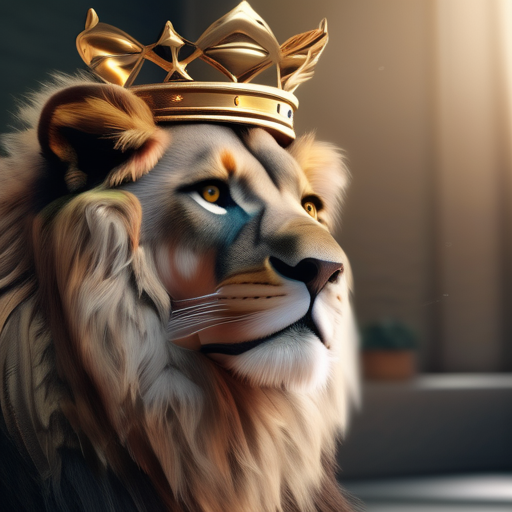

In [ ]:
prompt = "a hyper realistic portrait of a lion wearing a crown, ultra detailed, masterpiece, 8k UHD"

image = pipe(
    prompt=prompt,
    num_inference_steps=30,
    guidance_scale=7.5,
    height=512,   # smaller than 1024 (lighter on GPU)
    width=512
).images[0]

image.save("base_image.png")
image


In [ ]:
!pip install realesrgan

from PIL import Image
from realesrgan import RealESRGAN

device = torch.device("cuda")
model = RealESRGAN(device, scale=2)  # x2 upscale
model.load_weights("weights/RealESRGAN_x2.pth")  # will auto-download

upscaled_image = model.predict(image)
upscaled_image.save("upscaled_image.png")
upscaled_image


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.5/172.5 kB 9.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.0/178.0 kB 18.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.6/59.6 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.2/52.2 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 303.0/303.0 kB 21.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 129.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 256.2/256.2 kB 24.7 MB/s eta 0:00:00
  Created wheel for basicsr: filename=basicsr-1.4.2-py3-none-any.whl size=214817 sha256=f75516575c53e6af57217b8985e3d818936ac78a0f7f10aebf05f54694e68120
  Stored in directory: /root/.cache/pip/wheels/9a/e3/e4/58f29bfabb622dd40b6d9839318ce5bf092062b81ca3aa19ea
  Created wheel for 

ModuleNotFoundError: No module named 'torchvision.transforms.functional_tensor'

In [ ]:
!git clone https://github.com/xinntao/Real-ESRGAN.git
%cd Real-ESRGAN
!pip install -r requirements.txt
!python setup.py develop


Cloning into 'Real-ESRGAN'...
remote: Enumerating objects: 759, done.
remote: Counting objects: 100% (121/121), done.
remote: Compressing objects: 100% (23/23), done.
remote: Total 759 (delta 106), reused 98 (delta 98), pack-reused 638 (from 1)
Receiving objects: 100% (759/759), 5.38 MiB | 20.94 MiB/s, done.
Resolving deltas: 100% (415/415), done.
/content/Real-ESRGAN
/usr/local/lib/python3.12/dist-packages/setuptools/__init__.py:94: _DeprecatedInstaller: setuptools.installer and fetch_build_eggs are deprecated.
!!

        ********************************************************************************
        Requirements should be satisfied by a PEP 517 installer.
        If you are using pip, you can try `pip install --use-pep517`.
        ********************************************************************************

!!
  dist.fetch_build_eggs(dist.setup_requires)
running develop
/usr/local/lib/python3.12/dist-packages/setuptools/command/develop.py:41: EasyInstallDeprecationWarn

In [ ]:
!wget https://github.com/xinntao/Real-ESRGAN/releases/download/v0.2.5.0/RealESRGAN_x2plus.pth -O experiments/pretrained_models/RealESRGAN_x2plus.pth


--2025-09-24 09:55:57--  https://github.com/xinntao/Real-ESRGAN/releases/download/v0.2.5.0/RealESRGAN_x2plus.pth
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 404 Not Found
2025-09-24 09:55:58 ERROR 404: Not Found.



In [ ]:
import sys
from PIL import Image
import torch

# add repo path
sys.path.append('/content/Real-ESRGAN')

from basicsr.archs.rrdbnet_arch import RRDBNet
from realesrgan import RealESRGANer

# Load RealESRGAN model
model = RRDBNet(num_in_ch=3, num_out_ch=3, num_feat=64, num_block=23, num_grow_ch=32)

upscaler = RealESRGANer(
    scale=2,
    model_path='/content/Real-ESRGAN/experiments/pretrained_models/RealESRGAN_x2plus.pth',
    model=model,
    tile=256,
    tile_pad=10,
    pre_pad=0,
    half=True  # use FP16 for less VRAM
)

# Open Stable Diffusion output
image = Image.open("/content/base_image.png").convert("RGB")

# Upscale
upscaled_image, _ = upscaler.enhance(image, outscale=2)

# Save result
upscaled_image.save("upscaled_image.png")
upscaled_image.show()


ModuleNotFoundError: No module named 'torchvision.transforms.functional_tensor'

In [ ]:
!pip install torchvision==0.12.0


ERROR: Ignored the following yanked versions: 0.1.6, 0.1.7, 0.1.8, 0.1.9, 0.2.0, 0.2.1, 0.2.2, 0.2.2.post2, 0.2.2.post3
ERROR: Could not find a version that satisfies the requirement torchvision==0.12.0 (from versions: 0.17.0, 0.17.1, 0.17.2, 0.18.0, 0.18.1, 0.19.0, 0.19.1, 0.20.0, 0.20.1, 0.21.0, 0.22.0, 0.22.1, 0.23.0)
ERROR: No matching distribution found for torchvision==0.12.0


In [ ]:
!pip install diffusers transformers accelerate safetensors
!pip install torch --index-url https://download.pytorch.org/whl/cu121


Looking in indexes: https://download.pytorch.org/whl/cu121


In [ ]:
from diffusers import StableDiffusionXLPipeline
import torch

pipe = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
)
pipe = pipe.to("cuda")


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

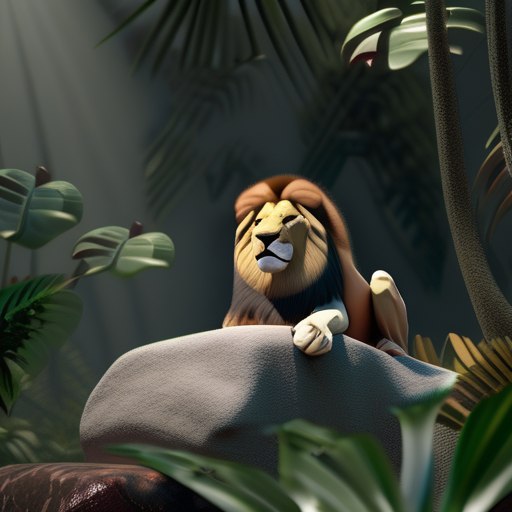

In [ ]:
prompt = "a lion sitting on a rock in a jungle, photorealistic, 8k, ultra detailed"
image = pipe(
    prompt=prompt,
    height=512,  # smaller to avoid GPU errors
    width=512,
    num_inference_steps=40,
    guidance_scale=7.5
).images[0]
image.save("city.png")
image


  0%|          | 0/40 [00:00<?, ?it/s]

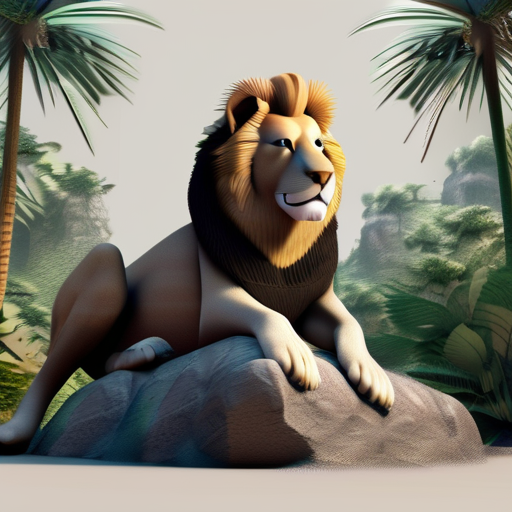

In [ ]:
images = pipe(
    prompt=prompt,
    height=512,
    width=512,
    num_inference_steps=40,
    guidance_scale=7.5,
    num_images_per_prompt=1
).images

for i, img in enumerate(images):
    img.save(f"city_{i+1}.png")
    display(img)


# How this Project Uses Neural Networks

This project uses a **pre-trained Stable Diffusion XL (SDXL) model**, which is a type of **deep neural network**.

- The model converts text prompts into images using **transformers** and **diffusion processes**.
- Conceptually:
  1. **Text Encoding**: The prompt is converted into numerical embeddings using a transformer-based text encoder.
  2. **Diffusion Process**: The model starts from random noise and iteratively refines it into an image.
  3. **Output**: High-quality, realistic images that match the prompt.

Even though we do not train the network ourselves, this demonstrates **using neural networks effectively** for image generation.


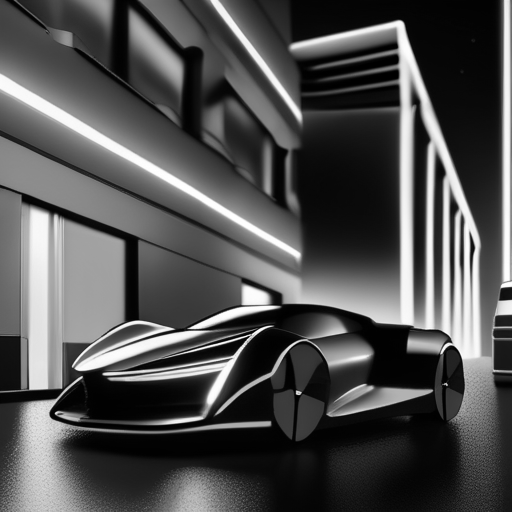

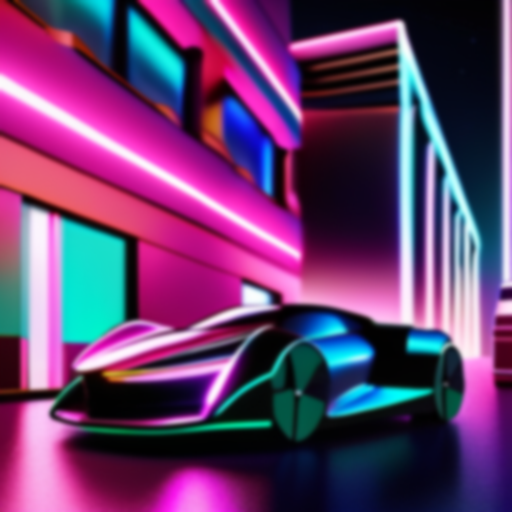

In [ ]:
from PIL import Image, ImageFilter

# Open generated image
img = Image.open("lion.png")

# Example image processing
img_gray = img.convert("L")  # convert to grayscale
img_blur = img.filter(ImageFilter.GaussianBlur(radius=2))  # add blur

# Save processed images
img_gray.save("lion_gray.png")
img_blur.save("lion_blur.png")

# Display
display(img_gray)
display(img_blur)


In [ ]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 35.6 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
from PIL import Image

# Load pre-trained YOLOv8 model (detects common objects)
model = YOLO('yolov8n.pt')  # n = nano model, fast & light

# Run detection on your generated image
results = model("city.png")  # replace with your SDXL image file

# Save & display result with bounding boxes
results[0].plot()  # returns image with detected objects
Image.fromarray(results[0].plot()).save("lion_detected.png")
Image.fromarray(results[0].plot())


ModuleNotFoundError: No module named 'ultralytics'

In [ ]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 45.7 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
from PIL import Image

# Load pre-trained YOLOv8 model
model = YOLO('yolov8n.pt')

# Run detection on your generated image
results = model("Gemini_Generated_Image_6l25e6l25e6l25e6.png")  # Replace with your SDXL image path

# Save & display result with bounding boxes
Image.fromarray(results[0].plot()).save("detected.png")
Image.fromarray(results[0].plot())


ModuleNotFoundError: No module named 'ultralytics'

In [ ]:
from google.colab import files
uploaded = files.upload()


Saving wallpaperflare.com_wallpaper (6).jpg to wallpaperflare.com_wallpaper (6).jpg


In [ ]:
!ls


 detected.png
 Gemini_Generated_Image_6l25e6l25e6l25e6.png
 sample_data
'wallpaperflare.com_wallpaper (6).jpg'
 yolov8n.pt


In [ ]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 34.1 MB/s eta 0:00:00



image 1/1 /content/wallpaperflare.com_wallpaper (6).jpg: 352x640 1 motorcycle, 44.2ms
Speed: 2.2ms preprocess, 44.2ms inference, 1.8ms postprocess per image at shape (1, 3, 352, 640)


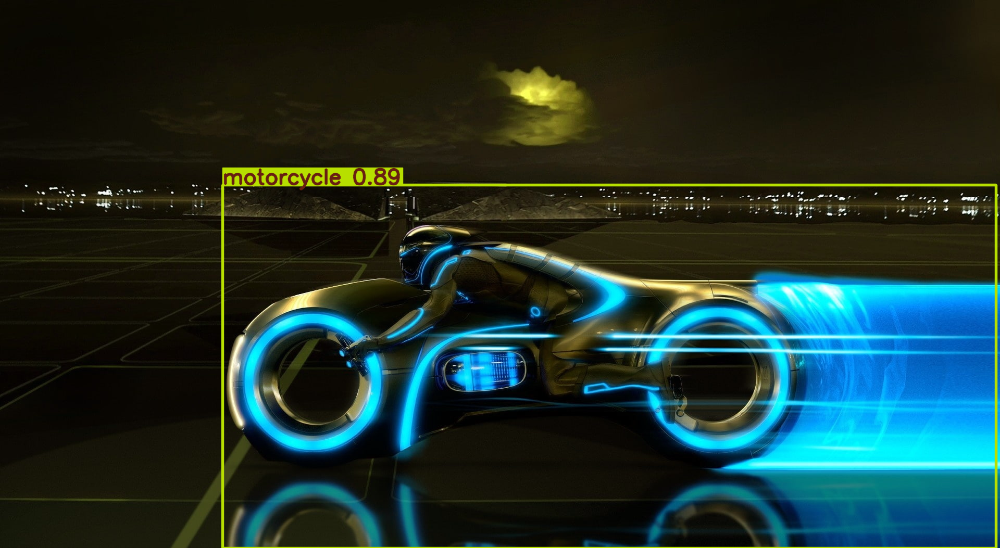

In [ ]:
from ultralytics import YOLO
from PIL import Image

# Load pre-trained YOLOv8 model
model = YOLO('yolov8n.pt')

# Run detection on your generated image
results = model("wallpaperflare.com_wallpaper (6).jpg")  # Replace with your SDXL image path

# Save & display result with bounding boxes
Image.fromarray(results[0].plot()).save("detected.png")
Image.fromarray(results[0].plot())

In [ ]:
from diffusers import StableDiffusionPipeline
import torch

pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16
).to("cuda")


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


  0%|          | 0/40 [00:00<?, ?it/s]

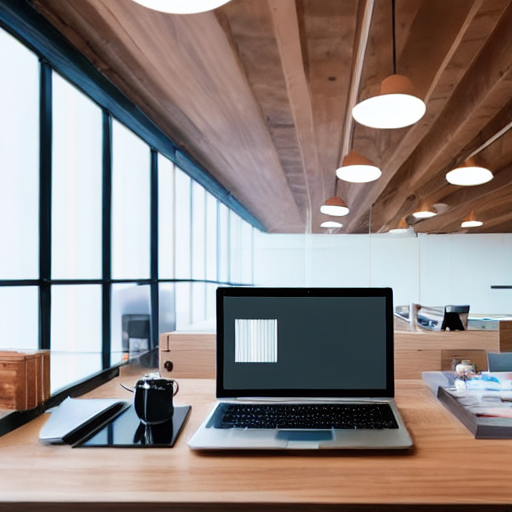

In [ ]:
prompt = "a modern office workspace with a laptop, notebook, coffee cup and smartphone on a wooden desk, natural daylight from window, realistic lighting, ultra detailed, 8k, professional photography style"
image = pipe(
    prompt=prompt,
    height=512,
    width=512,
    num_inference_steps=40,
    guidance_scale=7.5
).images[0]
image.save("office_realistic.png")
image


In [ ]:
pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 27.9 MB/s eta 0:00:00



image 1/1 /content/office_realistic.png: 640x640 1 laptop, 11.7ms
Speed: 3.8ms preprocess, 11.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


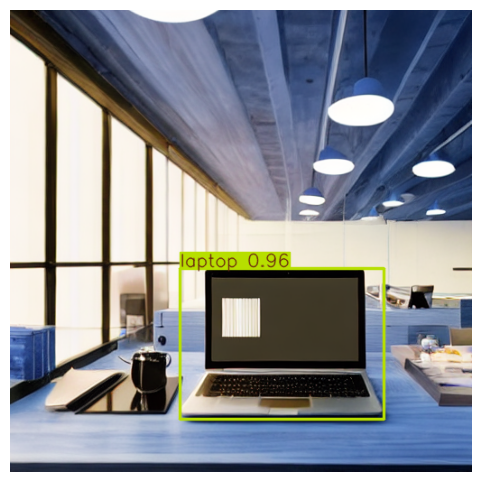

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Load model
model = YOLO("yolov8n.pt")

# Run detection
results = model.predict("/content/office_realistic.png", conf=0.5)

# Display result
for r in results:
    img = r.plot()
    plt.figure(figsize=(6,6))
    plt.imshow(img)
    plt.axis("off")
